## __Plato Notebook 2: Extended plate torque balance and synthetic velocities__

Thomas Schouten, Whitney Behr, Edward Clennett, Thorsten Becker

#### __0. Prepare Python__

First, we load the required packages.

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))

from plato.optimisation import Optimisation
from plato.plate_torques import PlateTorques
from plato.plot import PlotReconstruction

#### __1. Set up the PlateTorques object__

The below cell loads a `PlateTorques` object for the Müller et al. (2016) reconstruction by providing the ages of interest and the model string identifier "Muller2016", which automatically downloads the relevant files from the GPlately DataServer.

To accelerate the initialisation, the seafloor age and continental grids are loaded from the sample data folder. The seafloor age grids were obtained from the GPlately DataServer; the continental grids were obtained by reconstructing the present-day elevation as well as the depths of the Moho and lithosphere-asthenosphere (LAB) boundary from Lithoref (Afonso et al., 2019) using the `reconstruct` method of the GPlately `Raster` object.

In [2]:
# Set parameters
COMPUTE_TORQUES = True  # Whether or not to compute torques
PLOT_FIGS = True        # Whether or not to plot the results

# Plate reconstruction
reconstruction_name = "Muller2016" 

# Reconstruction ages of interest
ages = [0]

# Load excel file with settings
settings_file = os.path.join(os.getcwd(), "settings.xlsx")

# Set directory with sample data
data_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "sample_data", "M2016"))

# Set directory to save the results
results_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "..", "output_notebooks", "02a-Extended_torque_balance"))

# Set directory to save the figures
figs_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "..", "figures_notebooks", "02a-Extended_torque_balance"))

# Load seafloor age and continental grids
seafloor_age_grids = {}; continental_grids = {}
for age in ages:
    seafloor_age_grids[age] = xr.open_dataset(os.path.join(data_dir, "seafloor_age_grids", f"M2016_SeafloorAgeGrid_{age}Ma.nc"))
    continental_grids[age] = xr.open_dataset(os.path.join(data_dir, "continental_grids", f"M2016_ContinentalGrid_{age}Ma.nc"))

# Set up PlateTorques object
M2016 = PlateTorques(
    reconstruction_name = reconstruction_name, 
    ages = ages, 
    cases_file = settings_file,
    cases_sheet = "2a - Extended torque balance",
    files_dir = results_dir,
    rotation_file = os.path.join(data_dir, "gplates_files", "M2016_rotations_Lr-Hb.rot"),
    topology_file = os.path.join(data_dir, "gplates_files", "M2016_topologies.gpml"),
    polygon_file = os.path.join(data_dir, "gplates_files",  "M2016_static_polygons.gpml"),
    seafloor_age_grids = seafloor_age_grids,
    continental_grids = continental_grids,
)

Calculating RMS velocities: 100%|██████████| 1/1 [00:00<00:00, 10979.85it/s]


#### __2. Sampling and LAB depth calculation__

The below cell calls the `sample_all` method of the `PlateTorques` object to sample seafloor ages at subduction zones and grid points and the `calculate_LAB_depths` to sample the LAB depth below continents and calculate it from the seafloor age below oceans.

In [3]:
if COMPUTE_TORQUES:
    M2016.sample_all()

Adding values: 100%|██████████| 2/2 [00:00<00:00, 229.92it/s]


#### __3. Adding trench fill sediments__

The below cells add trench fill sediments to 

In [4]:
def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the Haversine distance between two sets of points on Earth.

    :param lat1:    Latitude of the first point in degrees.
    :type lat1:     float
    :param lon1:    Longitude of the first point in degrees.
    :type lon1:     float
    :param lat2:    Latitude of the second point in degrees.
    :type lat2:     float
    :param lon2:    Longitude of the second point in degrees.
    :type lon2:     float

    :return:        The Haversine distance between the two points.
    :rtype:         float
    """
    # Convert latitude and longitude from degrees to radians
    lat1 = np.deg2rad(lat1)
    lon1 = np.deg2rad(lon1)
    lat2 = np.deg2rad(lat2)
    lon2 = np.deg2rad(lon2)

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return c

In [5]:
if COMPUTE_TORQUES:
    # Load Heuret et al. (2012) data
    trench_sediment_thickness = pd.read_excel(os.path.join(data_dir, "present_day_sediments", "Heuret2012_data.xlsx"))

    # Add Heuret et al. (2012) data (which is in km!!) to the sediment thickness column in slabs
    for age in M2016.ages:
        for case in M2016.cases:
            if "seds" not in case:
                continue
            
            for i, _ in enumerate(M2016.slabs.data[age][case].lat):
                distance_to_segments = haversine(
                    M2016.slabs.data[age][case].loc[i, "lat"],
                    M2016.slabs.data[age][case].loc[i, "lon"],
                    trench_sediment_thickness.Latitude,
                    trench_sediment_thickness.Longitude
                )
                M2016.slabs.data[age][case].loc[i, "sediment_thickness"] = trench_sediment_thickness["Sediment thickness"][distance_to_segments.idxmin()] * 1e3

#### __4. Torque calculation__

The below cells uses the `calculate_all_torques` method of the `PlateTorques` object to compute the full torque balance for all cases with reconstructed motions.

In [6]:
if COMPUTE_TORQUES:
    M2016.calculate_all_torques()

Calculating residual forces at points: 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]


#### __5. Optimisation__

The below cells initialise an `Optimisation` object, that contains methods to optimise the free parameters in the plate torque balance, using the `PlateTorques` object.

Then

In [7]:
optimise_M2016 = Optimisation(M2016)

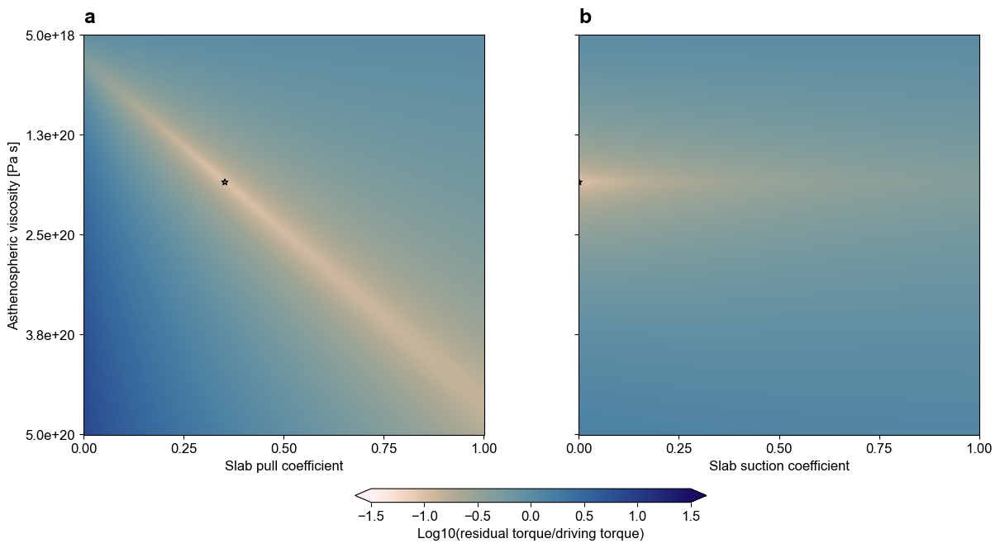

Optimal coefficients for case ref at 0 Ma: for the N America, S America, Pacific, Cocos, Nazca  plate(s), (PlateIDs:  101.0, 201.0, 901.0, 909.0, 911.0 )
Minimum residual torque: 10.05% of driving torque
Optimum viscosity [Pa s]: 1.88e+20
Optimum drag coefficient [Pa s/m]: 9.38e+14
Optimum slab pull constant: 35.27%
Optimum slab suction constant: 0.00%


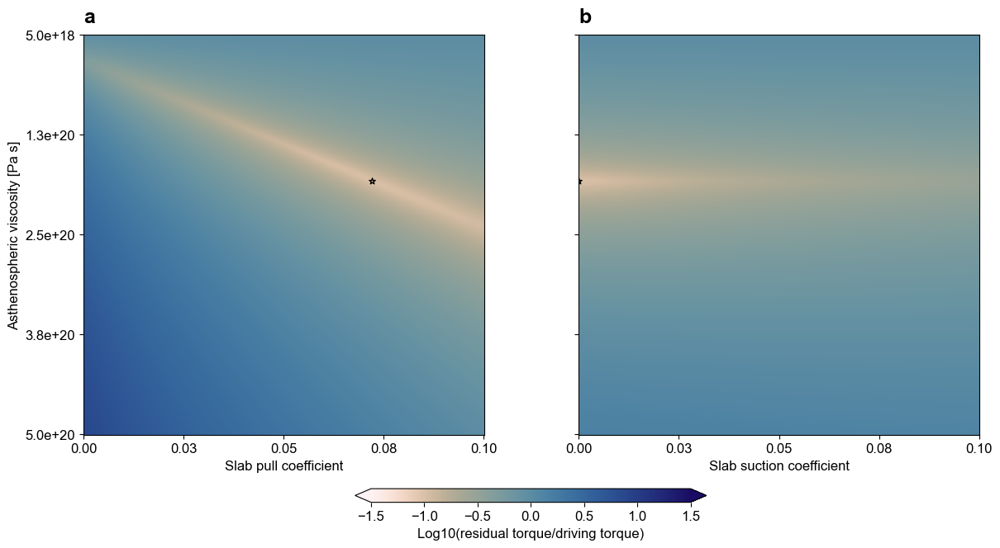

Optimal coefficients for case seds at 0 Ma: for the N America, S America, Pacific, Cocos, Nazca  plate(s), (PlateIDs:  101.0, 201.0, 901.0, 909.0, 911.0 )
Minimum residual torque: 10.29% of driving torque
Optimum viscosity [Pa s]: 1.87e+20
Optimum drag coefficient [Pa s/m]: 9.33e+14
Optimum slab pull constant: 7.21%
Optimum slab suction constant: 0.00%


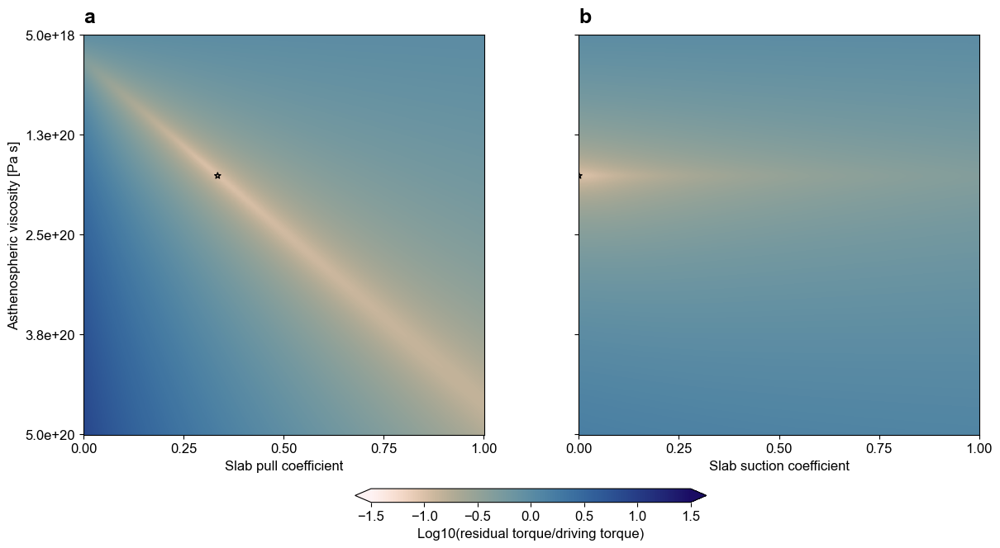

Optimal coefficients for case keels at 0 Ma: for the N America, S America, Pacific, Cocos, Nazca  plate(s), (PlateIDs:  101.0, 201.0, 901.0, 909.0, 911.0 )
Minimum residual torque: 10.02% of driving torque
Optimum viscosity [Pa s]: 1.80e+20
Optimum drag coefficient [Pa s/m]: 8.98e+14
Optimum slab pull constant: 33.47%
Optimum slab suction constant: 0.00%


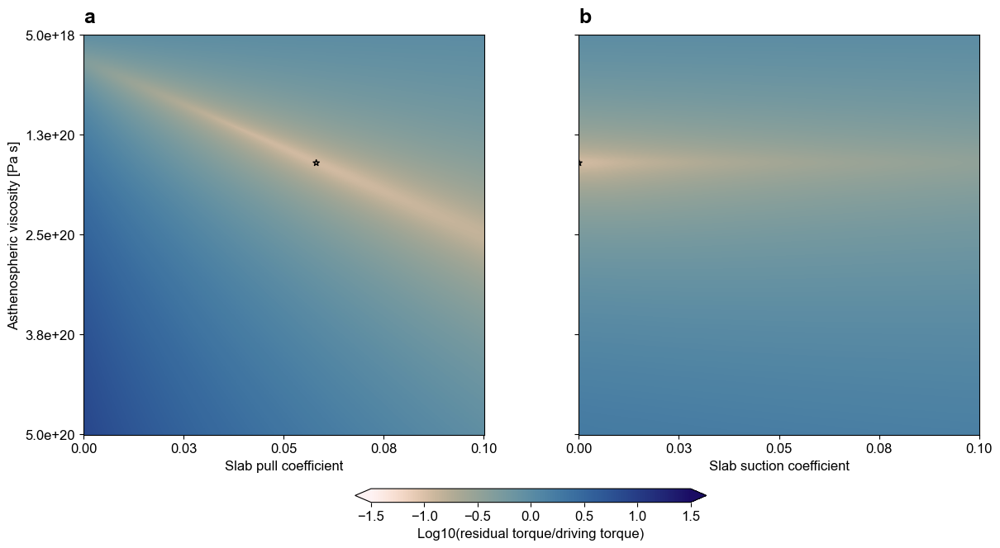

Optimal coefficients for case seds_keels at 0 Ma: for the N America, S America, Pacific, Cocos, Nazca  plate(s), (PlateIDs:  101.0, 201.0, 901.0, 909.0, 911.0 )
Minimum residual torque: 11.34% of driving torque
Optimum viscosity [Pa s]: 1.64e+20
Optimum drag coefficient [Pa s/m]: 8.19e+14
Optimum slab pull constant: 5.81%
Optimum slab suction constant: 0.00%


In [8]:
if COMPUTE_TORQUES:
    reconstructed_cases = [case for case in M2016.cases if "syn" not in case]
    optimisation_results = optimise_M2016.minimise_residual_torque_v4(
        0,
        cases = reconstructed_cases,
        plateIDs=[101, 201, 901, 909, 911],
    )
    normalised_residual_torques, optimal_sp_consts, optimal_viscs, optimal_ss_consts, optimal_indices = optimisation_results

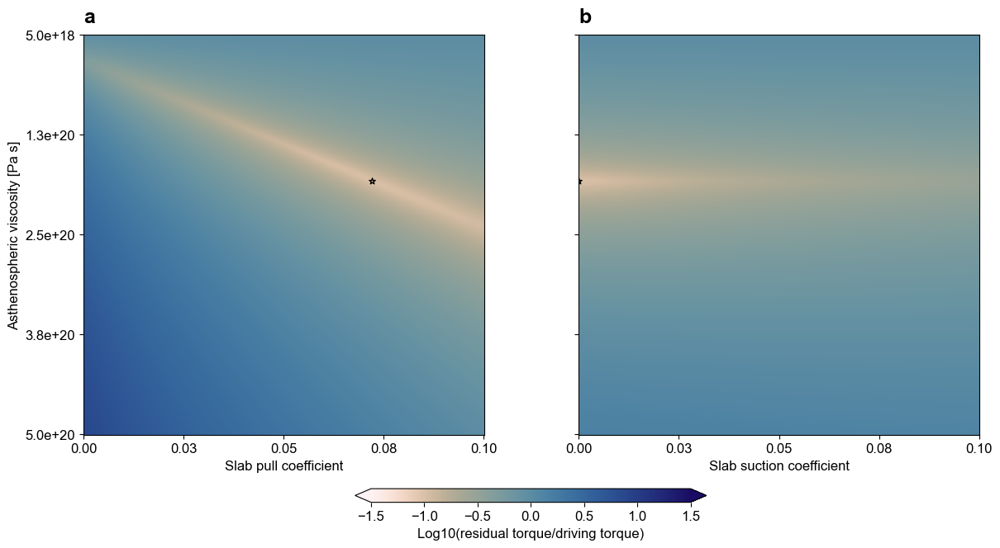

Optimal coefficients for case seds at 0 Ma: for the N America, S America, Pacific, Cocos, Nazca  plate(s), (PlateIDs:  101.0, 201.0, 901.0, 909.0, 911.0 )
Minimum residual torque: 10.29% of driving torque
Optimum viscosity [Pa s]: 1.87e+20
Optimum drag coefficient [Pa s/m]: 9.33e+14
Optimum slab pull constant: 7.21%
Optimum slab suction constant: 0.00%


In [9]:
_ = optimise_M2016.minimise_residual_torque_v4(
        0,
        cases = "seds",
        plateIDs = [101, 201, 901, 909, 911],
        savefig = os.path.join(figs_dir, "M2016_calibration.png"),
    )

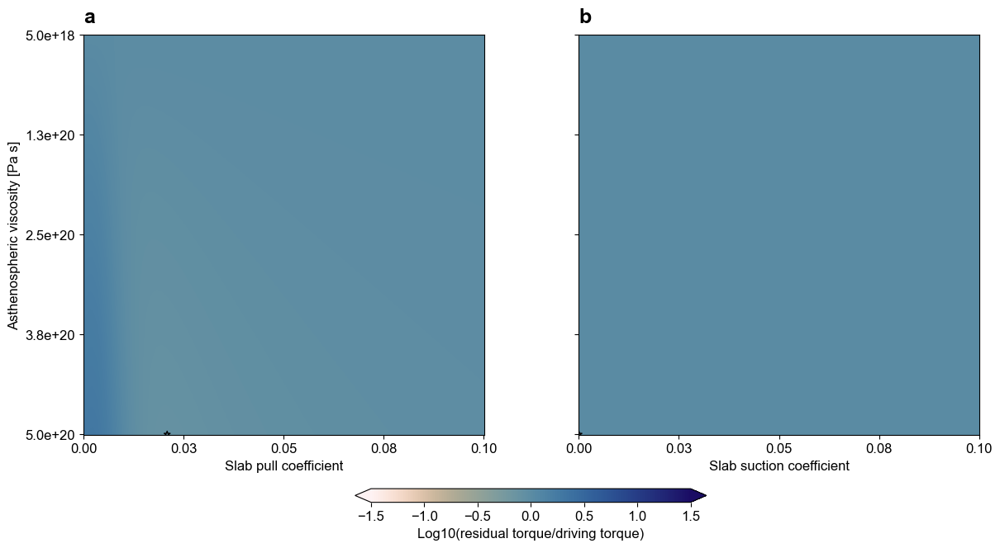

Optimal coefficients for case seds at 0 Ma: for the Unknown  plate(s), (PlateIDs:  608.0 )
Minimum residual torque: 79.59% of driving torque
Optimum viscosity [Pa s]: 5.00e+20
Optimum drag coefficient [Pa s/m]: 2.50e+15
Optimum slab pull constant: 2.08%
Optimum slab suction constant: 0.00%


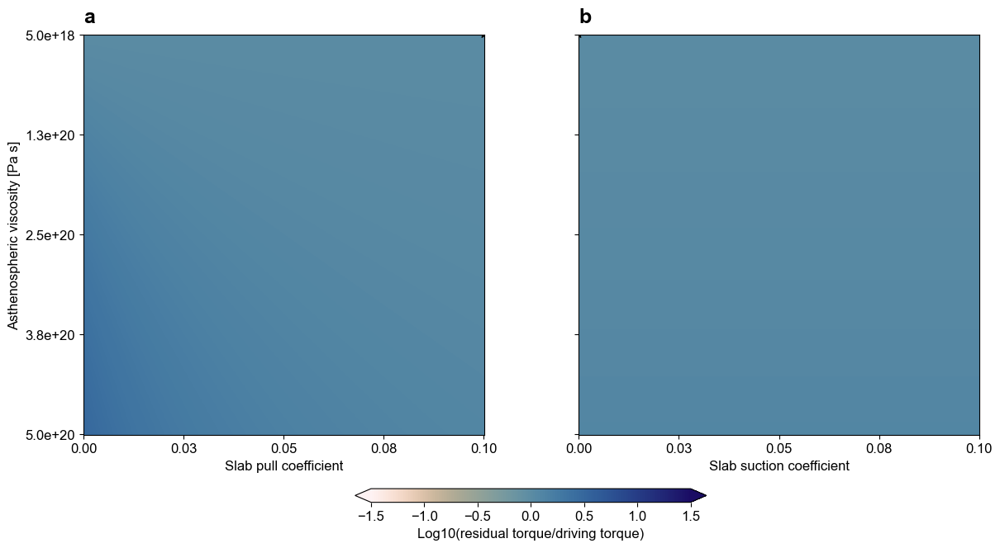

Optimal coefficients for case seds at 0 Ma: for the Unknown  plate(s), (PlateIDs:  653.0 )
Minimum residual torque: 100.12% of driving torque
Optimum viscosity [Pa s]: 5.00e+18
Optimum drag coefficient [Pa s/m]: 2.50e+13
Optimum slab pull constant: 10.00%
Optimum slab suction constant: 0.00%


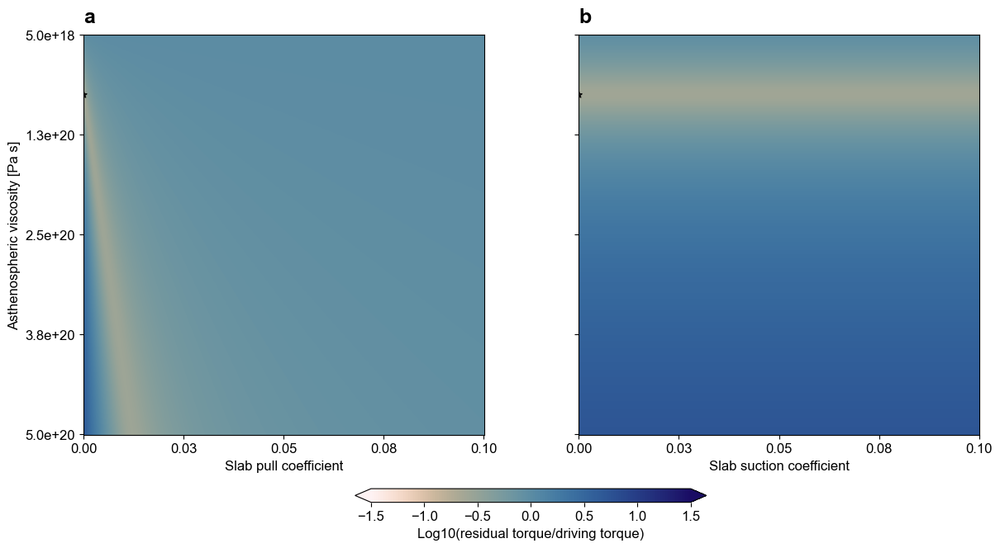

Optimal coefficients for case seds at 0 Ma: for the Cocos  plate(s), (PlateIDs:  909.0 )
Minimum residual torque: 24.90% of driving torque
Optimum viscosity [Pa s]: 7.94e+19
Optimum drag coefficient [Pa s/m]: 3.97e+14
Optimum slab pull constant: 0.00%
Optimum slab suction constant: 0.00%


In [22]:
if COMPUTE_TORQUES:
    plateIDs = [608, 653, 909]; plate_names = ["Philippine_Sea", "Caroline", "Cocos"]
    for plateID, plate_name in zip(plateIDs, plate_names):
        _ = optimise_M2016.minimise_residual_torque_v4(
            0,
            cases = "seds",
            plateIDs=[plateID],
            savefig = os.path.join(figs_dir, f"{plate_name}_calibration.png"),
        )

In [10]:
if COMPUTE_TORQUES:
    for age in M2016.ages:
        for case in M2016.cases:
            if "syn" in case:
                continue

            M2016.slabs.data[age][case]["slab_pull_constant"] = optimal_sp_consts[age][case]
            M2016.settings.options[case]["Slab pull constant"] = optimal_sp_consts[age][case]
            M2016.slabs.data[age][case]["slab_suction_constant"] = optimal_ss_consts[age][case]
            M2016.settings.options[case]["Slab suction constant"] = optimal_ss_consts[age][case]
            M2016.settings.options[case]["Mantle viscosity"] = optimal_viscs[age][case]

            M2016.slabs.data[age][f"syn_{case}"]["slab_pull_constant"] = optimal_sp_consts[age][case]
            M2016.settings.options[f"syn_{case}"]["Slab pull constant"] = optimal_sp_consts[age][case]
            M2016.slabs.data[age][f"syn_{case}"]["slab_suction_constant"] = optimal_ss_consts[age][case]
            M2016.settings.options[f"syn_{case}"]["Slab suction constant"] = optimal_ss_consts[age][case]
            M2016.settings.options[f"syn_{case}"]["Mantle viscosity"] = optimal_viscs[age][case]

    synthetic_cases = [case for case in M2016.cases if "syn" in case]
    M2016.calculate_slab_pull_torque(cases = synthetic_cases)
    M2016.calculate_slab_suction_torque(cases = synthetic_cases)
    M2016.calculate_mantle_drag_torque(cases = synthetic_cases)

Calculating mantle drag torque on plates: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


#### __6. Synthetic velocities__

The below cells 

In [11]:
if COMPUTE_TORQUES:
    M2016.calculate_synthetic_velocity()

Calculating RMS velocities: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


In [12]:
if COMPUTE_TORQUES:
    M2016.save_all()

Saving Globe: 100%|██████████| 8/8 [00:00<00:00, 395.51it/s]


#### __7. Visualisation__

The below cells 

In [3]:
# Plotting parameters
cm2in = 0.3937008
fig_width = 18*cm2in*2; fig_height_graphs = 8*cm2in*2; fig_height_maps = 10.5*cm2in*2
plt.rcParams["font.size"] = 12
plt.rcParams["font.family"] = "Arial"
title_fontsize = 18
projection = ccrs.Robinson(central_longitude = 160)
annotations = ["a", "b", "c", "d"]

In [4]:
plot_M2016 = PlotReconstruction(M2016)

Checking whether the requested files need to be updated...
Requested files are up-to-date!
No continents in Muller2016.


Warning 1: /Users/thomas/Library/Caches/gplately/Muller2016.unzip/Muller_etal_2016_AREPS_Supplement_v1.17/Shapefiles/Coastlines/Global_coastlines_2015_v1_low_res.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.


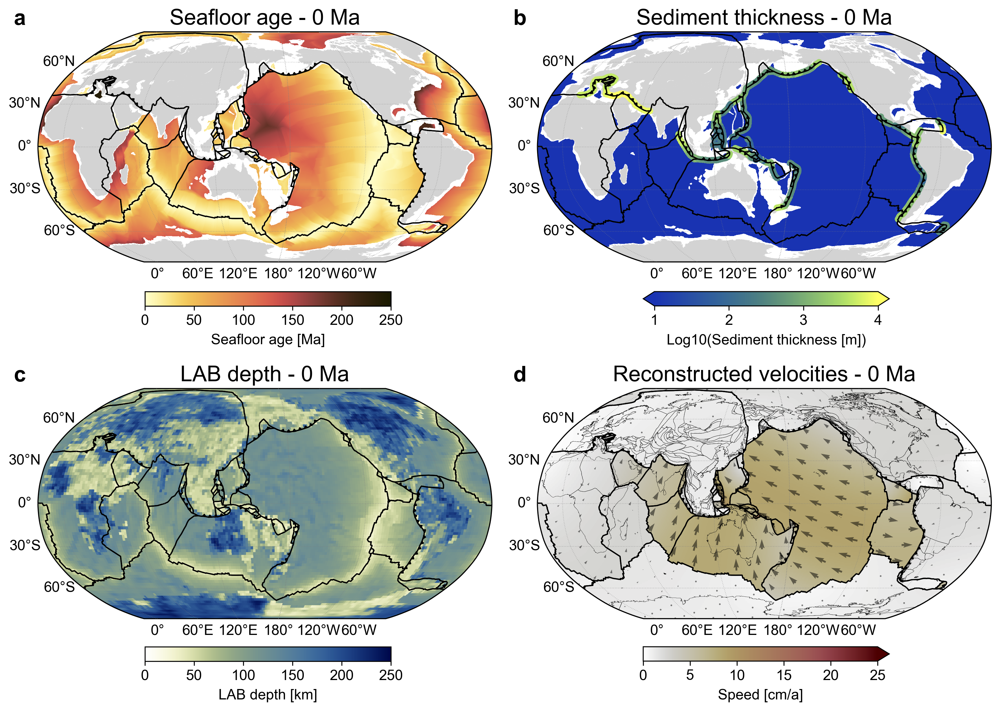

In [6]:
# Create a figure and gridspec
fig = plt.figure(figsize=(fig_width, 11.3*cm2in*2), dpi=300)
gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.5)

# Define the age to plot
plot_age = 0

plot_case = "seds_keels"

# Suplot 1: seafloor ages
ax1 = plt.subplot(gs[0, 0], projection=projection)
ax1.set_title(f"Seafloor age - {plot_age} Ma", fontsize=title_fontsize)
ages = plot_M2016.plot_seafloor_age_map(ax1, plot_age)

# Suplot 2: trench fill sediments
ax2 = plt.subplot(gs[0, 1], projection=projection)
ax2.set_title(f"Sediment thickness - {plot_age} Ma", fontsize=title_fontsize)
thicknesses = plot_M2016.plot_sediment_map(ax2, plot_age, plot_case, vmin=1e1)

# Suplot 3: depth of the lithosphere-asthenosphere boundary
ax3 = plt.subplot(gs[1, 0], projection=projection)
ax3.set_title(f"LAB depth - {plot_age} Ma", fontsize=title_fontsize)
depths = plot_M2016.plot_LAB_depth_map(ax3, plot_age, plot_case, vmax=2.5e2)

# Suplot 4: reconstructed velocities
ax4 = plt.subplot(gs[1, 1], projection=projection)
ax4.set_title(f"Reconstructed velocities - {plot_age} Ma", fontsize=title_fontsize)
velocities = plot_M2016.plot_velocity_map(ax4, plot_age, plot_case)

for m, ax in enumerate([ax1, ax2, ax3, ax4]):
    ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)

# Create new grids for the colourbars
cax1 = fig.add_axes([0.212, 0.52, 0.2, 0.02*(10.5/11.3)])
cax2 = fig.add_axes([0.617, 0.52, 0.2, 0.02*(10.5/11.3)])
cax3 = fig.add_axes([0.212, 0.06, 0.2, 0.02*(10.5/11.3)])
cax4 = fig.add_axes([0.617, 0.06, 0.2, 0.02*(10.5/11.3)])

# Create a colorbar below the subplots
cbar1 = plt.colorbar(ages, cax=cax1, orientation="horizontal")
cbar2 = plt.colorbar(thicknesses[0], cax=cax2, orientation="horizontal", extend="both", extendfrac=5e-2)
cbar3 = plt.colorbar(depths, cax=cax3, orientation="horizontal")
cbar4 = plt.colorbar(velocities[0], cax=cax4, orientation="horizontal", extend="max", extendfrac=5e-2)

# Set colorbar label
cbar1.set_label("Seafloor age [Ma]", labelpad=5)
cbar2.set_label("Log10(Sediment thickness [m])", labelpad=5)
cbar3.set_label("LAB depth [km]", labelpad=5)
cbar4.set_label("Speed [cm/a]", labelpad=5)

# Save the figure
plt.savefig(os.path.join(figs_dir, "M2016_data.png"), dpi=300, bbox_inches="tight")

# Show the figure
plt.show()

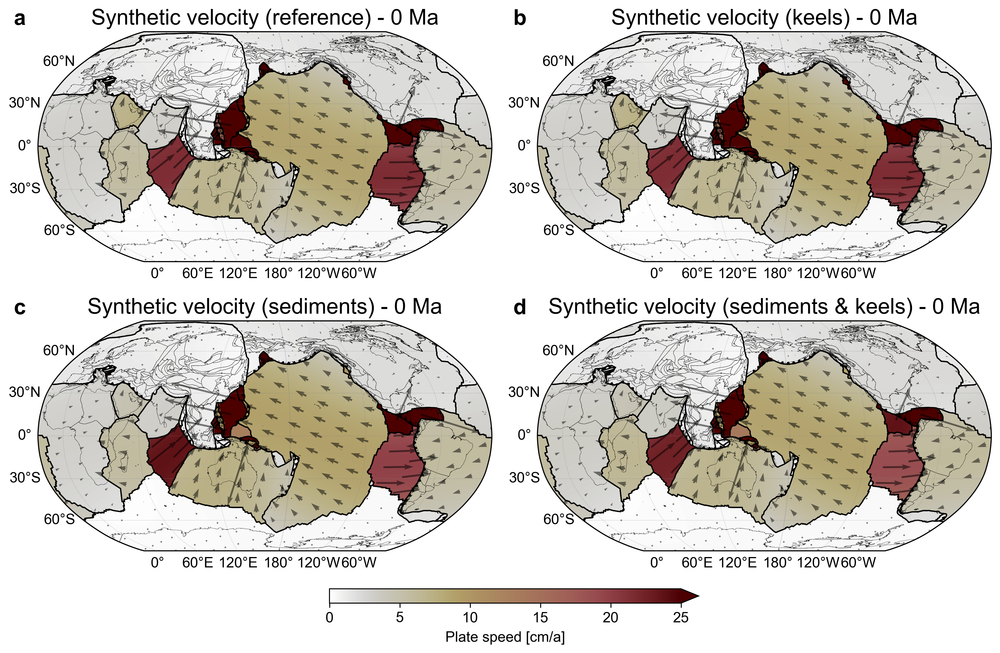

In [16]:
# Create a figure and gridspec
fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

# Define the age to plot
plot_age = 0

# Define the cases to plot
plot_cases = ["syn_ref", "syn_keels", "syn_seds", "syn_seds_keels"]
plot_titles = ["reference", "keels", "sediments", "sediments & keels"]

# Plot slab pull constant along trenches for each case
m = 0
for i in range(2):
    for j in range(2):
        ax = plt.subplot(gs[i, j], projection=projection)
        ax.set_title(f"Synthetic velocity ({plot_titles[m]}) - {plot_age} Ma", fontsize=title_fontsize)
        velocities = plot_M2016.plot_velocity_map(ax, plot_age, plot_cases[m])
        ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)

        m += 1

# Create a new grid for the colorbar
cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

# Create a colorbar below the subplots
cbar = plt.colorbar(velocities[0], cax=cax, orientation="horizontal", extend="max", extendfrac=5e-2)

# Set colorbar label
cbar.set_label("Plate speed [cm/a]", labelpad=5)

# Save the figure
plt.savefig(os.path.join(figs_dir, "M2016_synthetic_velocity_maps.png"), dpi=300, bbox_inches="tight")

# Show the figure
plt.show()

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 549.50it/s]


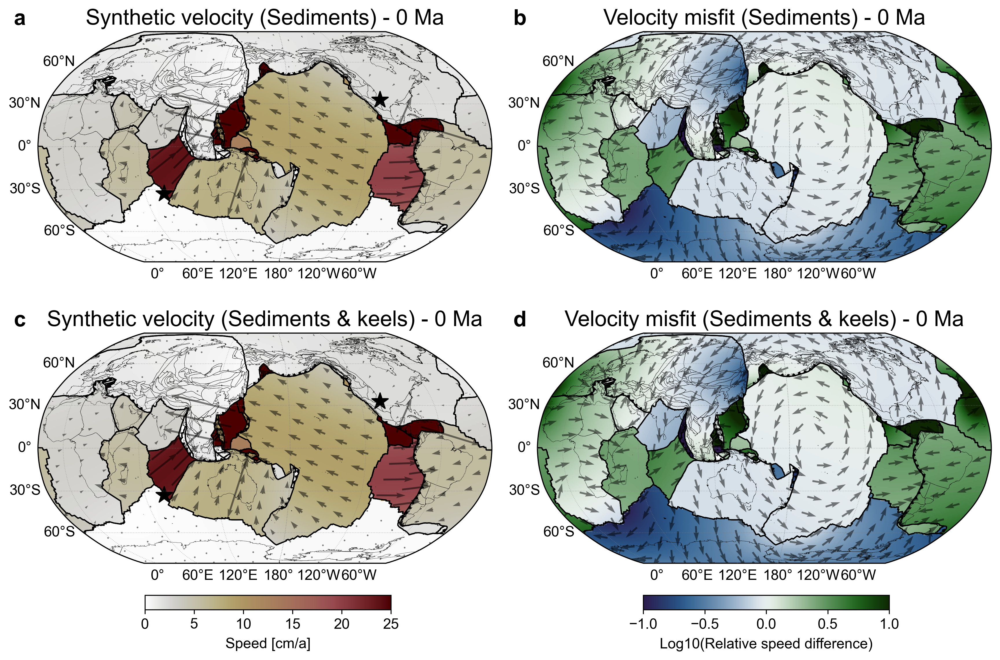

In [17]:
# Create a figure and gridspec
fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.2)

# Define the age to plot
plot_age = 0

# Define the cases to plot
plot_cases = ["syn_seds", "syn_seds_keels"]
plot_titles = ["Sediments", "Sediments & keels"]

# Plot slab pull constant along trenches for each case
m = 0
for i in range(2):
    for j in range(2):
        ax = plt.subplot(gs[i, j], projection=projection)
        if j == 0:
            ax.set_title(f"Synthetic velocity ({plot_titles[i]}) - {plot_age} Ma", fontsize=title_fontsize)
            vels = plot_M2016.plot_velocity_map(ax, plot_age, plot_cases[j], NET_ROTATION_POLE=True)
        else:
            ax.set_title(f"Velocity misfit ({plot_titles[i]}) - {plot_age} Ma", fontsize=title_fontsize)
            rel_vel_diffs = plot_M2016.plot_relative_velocity_difference_map(ax, plot_age, plot_cases[j], "ref")
        ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)

        m += 1

#  Create new grids for the colourbars
cax1 = fig.add_axes([0.212, 0.06, 0.2, 0.02])
cax2 = fig.add_axes([0.617, 0.06, 0.2, 0.02])

# Create a colorbar below the subplots
cbar1 = plt.colorbar(vels[0], cax=cax1, orientation="horizontal")
cbar2 = plt.colorbar(rel_vel_diffs[0], cax=cax2, orientation="horizontal")

# Set colorbar label
cbar1.set_label("Speed [cm/a]", labelpad=5)
cbar2.set_label("Log10(Relative speed difference)", labelpad=5)

# Save the figure
plt.savefig(os.path.join(figs_dir, "M2016_velocity_difference_maps.png"), dpi=300, bbox_inches="tight")

# Show the figure
plt.show()

In [18]:
def get_geometric_properties(
        plates: pd.DataFrame,
        slabs: pd.DataFrame,
    ):
    """
    Function to get geometric properties of plates.

    :param plates:                plates
    :type plates:                 pandas.DataFrame
    :param slabs:                 slabs
    :type slabs:                  pandas.DataFrame

    :return:                      plates
    :rtype:                       pandas.DataFrame
    """
    # Calculate trench length and omega
    for plateID in plates.plateID:
        if plateID in slabs.lower_plateID.unique():
            plates.loc[plates.plateID == plateID, "trench_length"] = slabs[slabs.lower_plateID == plateID].trench_segment_length.sum()
            plates.loc[plates.plateID == plateID, "zeta"] = plates[plates.plateID == plateID].area.values[0] / plates[plates.plateID == plateID].trench_length.values[0]

    return plates

In [27]:
# Get geometric properties of plates
for age in M2016.ages:
    for case in M2016.cases:
        M2016.plates.data[age][case] = get_geometric_properties(M2016.plates.data[age][case], M2016.slabs.data[age][case])

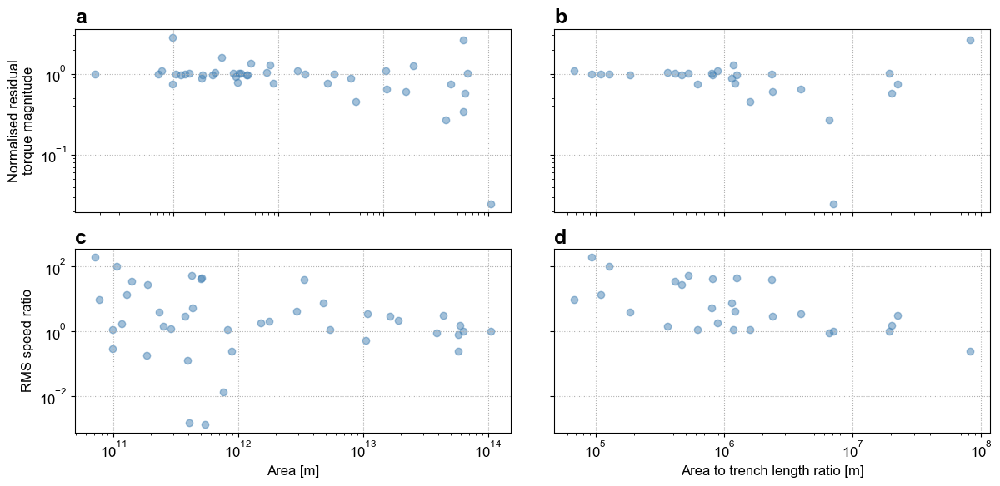

In [44]:
# Create the figure
fig = plt.figure(figsize=(fig_width, fig_height_graphs))

# Define a GridSpec with 1 row, 2 columns, and reduced horizontal space
gs = gridspec.GridSpec(2, 2, figure=fig, wspace=0.1)  # Adjust wspace as needed

k = 0
# Plot on each axis
for i in range(2):
    for j in range(2):
        ax = fig.add_subplot(gs[i, j])
        # X data: area if i == 0, otherwise zeta
        x_data = M2016.plates.data[0]["ref"].area if j == 0 else M2016.plates.data[0]["ref"].zeta
        # Y data: RMS speed ratio
        y_data = M2016.plates.data[0]["syn_seds"].velocity_rms_mag / M2016.plates.data[0]["ref"].velocity_rms_mag if i == 1 else M2016.plates.data[0]["ref"].residual_torque_mag / M2016.plates.data[0]["ref"].driving_torque_mag

        ax.scatter(
            x_data,
            y_data,
            c="steelblue", alpha=0.5
        )

        ax.loglog()
        ax.grid(ls=":")
        ax.annotate("abcd"[k], xy=(0, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)

        # Axis labels
        if j == 0:
            ax.set_xlabel("Area [m]") if i == 1 else ax.set_ylabel(None)
            ax.set_ylabel("RMS speed ratio") if i == 1 else ax.set_ylabel("Normalised residual\ntorque magnitude")
        else:
            ax.set_xlabel("Area to trench length ratio [m]") if i == 1 else ax.set_ylabel(None)
            ax.set_yticklabels([])

        if i == 0:
            ax.set_xticklabels([])

        k += 1

fig.savefig(os.path.join(figs_dir, "M2016_plate_area_vs_speed_ratio.png"), dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# Create the figure
fig = plt.figure(figsize=(fig_width, fig_height_graphs * 0.5))

# Define a GridSpec with 1 row, 2 columns, and reduced horizontal space
gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.1)  # Adjust wspace as needed

# Create axes in the grid
axes = [fig.add_subplot(gs[0, i]) for i in range(2)]

# Plot on each axis
for i, ax in enumerate(axes):
    # X data: area if i == 0, otherwise zeta
    x_data = M2016.plates.data[0]["ref"].area if i == 0 else M2016.plates.data[0]["ref"].zeta
    # Y data: RMS speed ratio
    y_data = M2016.plates.data[0]["syn_seds"].velocity_rms_mag / M2016.plates.data[0]["ref"].velocity_rms_mag

    ax.scatter(
        x_data,
        y_data,
        c="steelblue", alpha=0.5
    )

    ax.loglog()
    ax.grid(ls=":")

    # Axis labels
    if i == 0:
        ax.set_xlabel("Area [m]")
        ax.set_ylabel("RMS speed ratio")
    else:
        ax.set_xlabel("Area to trench length ratio [m]")
        ax.set_yticklabels([])

fig.savefig(os.path.join(figs_dir, "M2016_plate_area_vs_speed_ratio.png"), dpi=300, bbox_inches="tight")
plt.show()

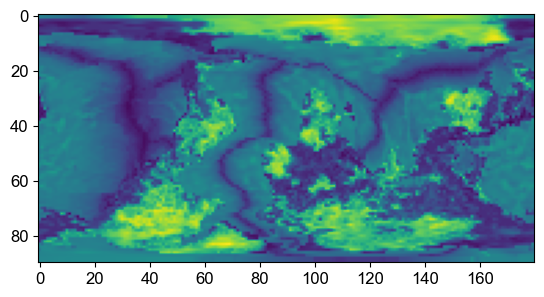

In [49]:
plt.imshow(M2016.grids.continent[0].LAB_depth)